# Задание 4

In [1]:
import pymol

In [3]:
import __main__
__main__.pymol_argv = [ 'pymol', '-x' ]
import pymol
pymol.finish_launching()
from pymol import cmd,stored
from IPython.display import Image
import time
cmd.reinitialize()
cmd.do('bg white')

## Задача 1.1

In [290]:
cmd.fetch ('2ROO')

'2ROO'

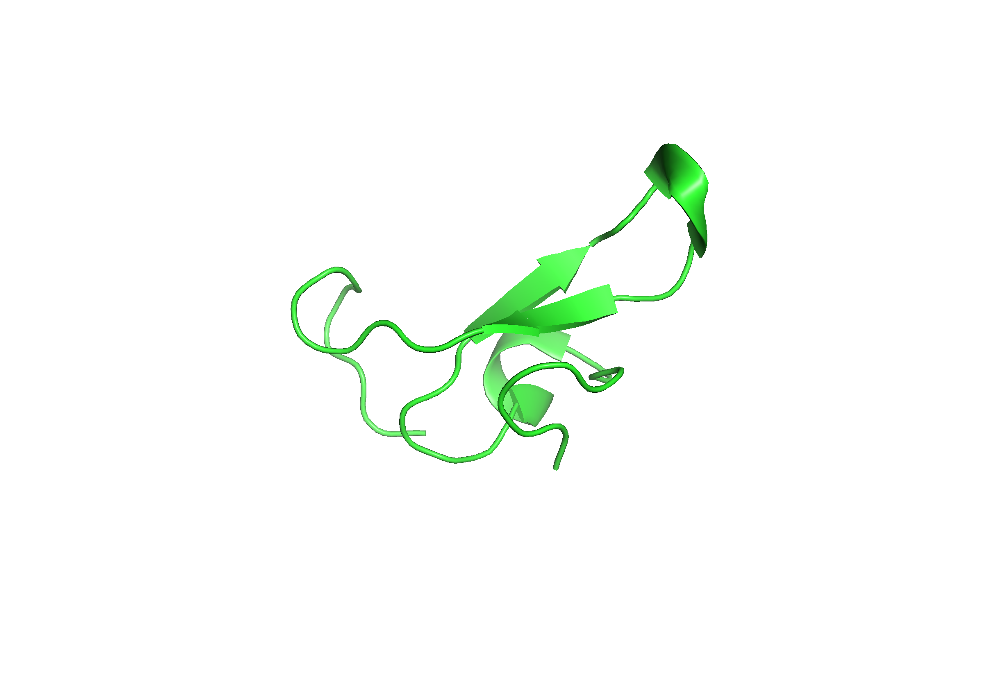

In [134]:
cmd.png('hw4_1.png')
cmd.ray(800,600)
Image(filename='hw4_1.png')

In [292]:
# Рисунок токсина с основной цепью в виде cartoon
cmd.do("hide everything, all")
cmd.do("show cartoon, 2ROO")
cmd.do("set cartoon_rect_length, 1.2")
cmd.do("set cartoon_rect_width, 0.3")
cmd.do("set cartoon_discrete_colors, on")

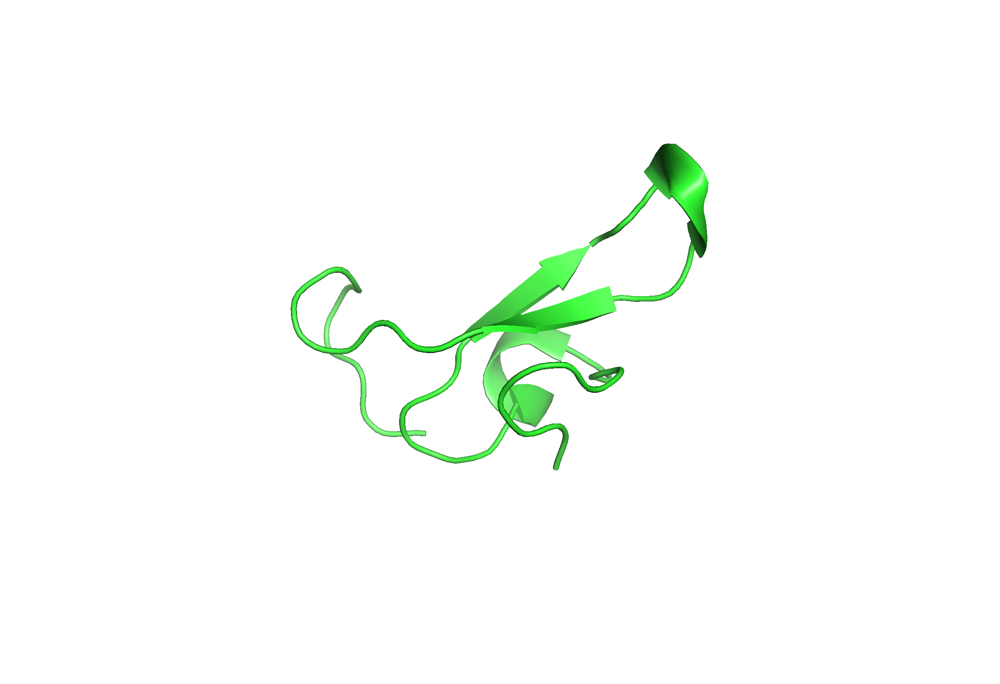

In [138]:
cmd.png('hw4_1.png')
cmd.ray(800,600)
Image(filename='hw4_1.png')

In [294]:
# Показать боковые цепи остатков без атомов водорода в виде sticks
cmd.create("toxin_cartoon", "2ROO")                                     # только cartoon
cmd.create("toxin_sidechains", "2ROO and not name N+C+O+OXT")        # только боковые цепи
cmd.hide("everything", "all")
cmd.show("cartoon", "toxin_cartoon")
cmd.show("sticks", "toxin_sidechains")
cmd.remove("hydro")

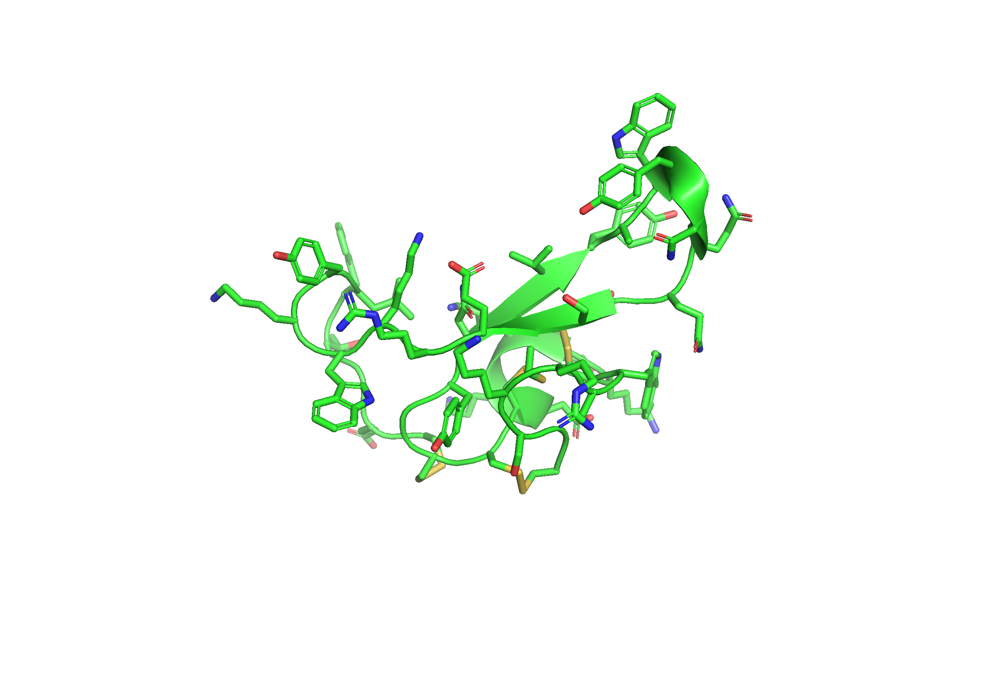

In [194]:
cmd.png('hw4_1.png')
cmd.ray(800,600)
Image(filename='hw4_1.png')

In [296]:
# Покрасить боковые цепи согласно заданию
cmd.color("green",   "toxin_sidechains and resn LEU+ILE+VAL+ALA+TRP+MET+PRO+TYR+PHE")
cmd.color("blue",    "toxin_sidechains and resn ARG+LYS")
cmd.color("red",     "toxin_sidechains and resn ASP+GLU")
cmd.color("magenta", "toxin_sidechains and resn GLN+ASN+THR+SER+HIS")

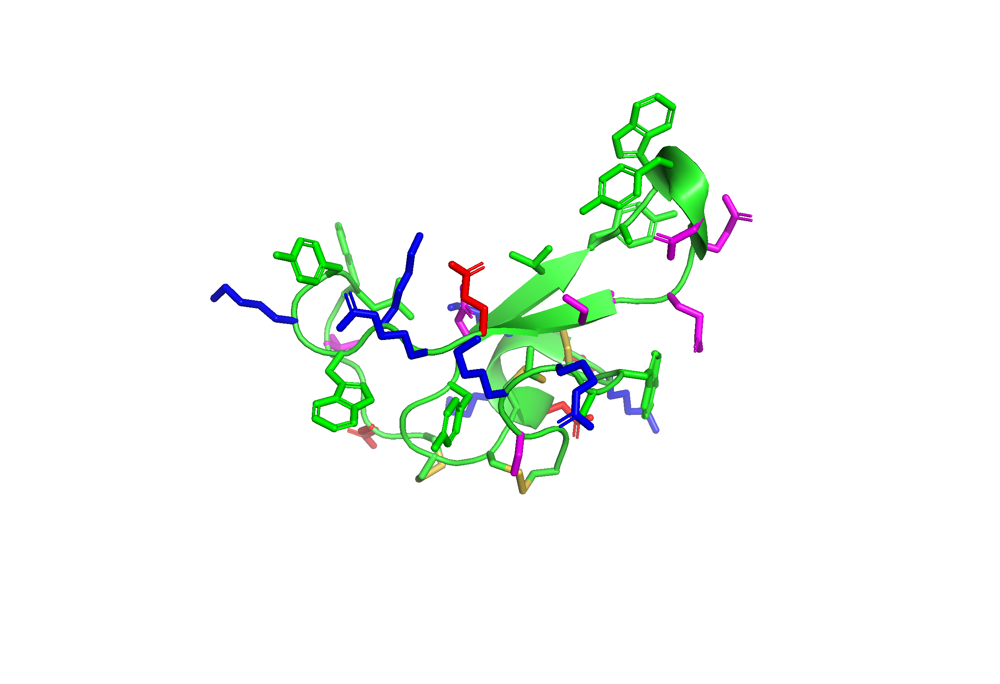

In [198]:
cmd.png('hw4_1.png')
cmd.ray(800,600)
Image(filename='hw4_1.png')

In [298]:
# Бета-слой покрасить цветом cyan, остальные петли покрасить цветом grey50
cmd.color("cyan",   "toxin_cartoon and ss s")   # бета-листы
cmd.color("grey50", "toxin_cartoon and not ss s and not ss h")   # петли как loops в моей структуре не нашлись, поэтому методом исключения их окрасила так

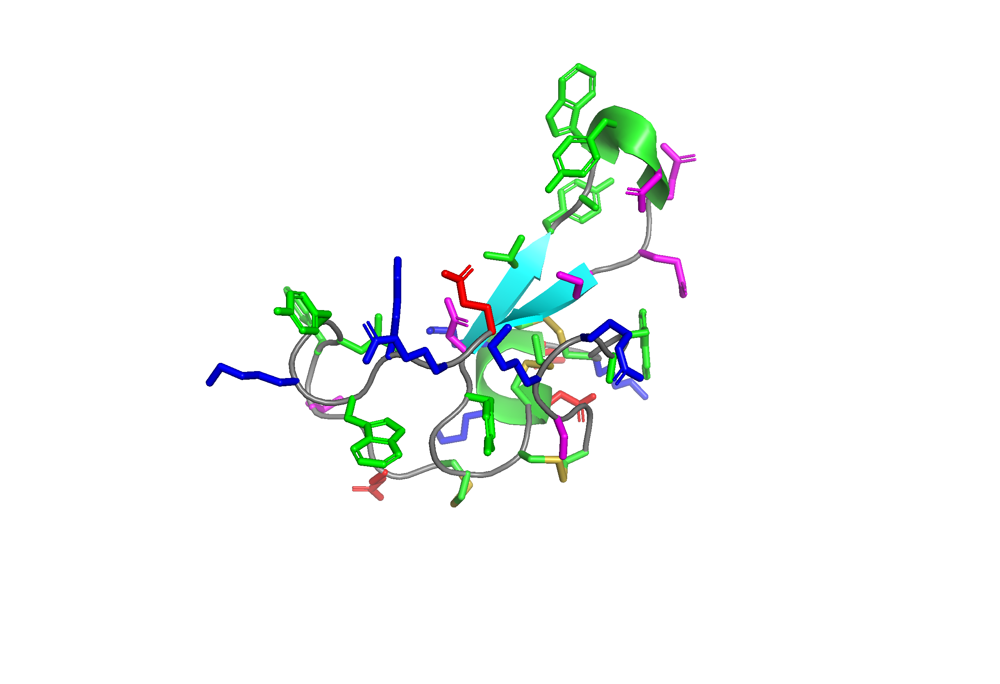

In [208]:
cmd.png('hw4_1.png')
cmd.ray(800,600)
Image(filename='hw4_1.png')

Подвину два остатка к бета-листу:

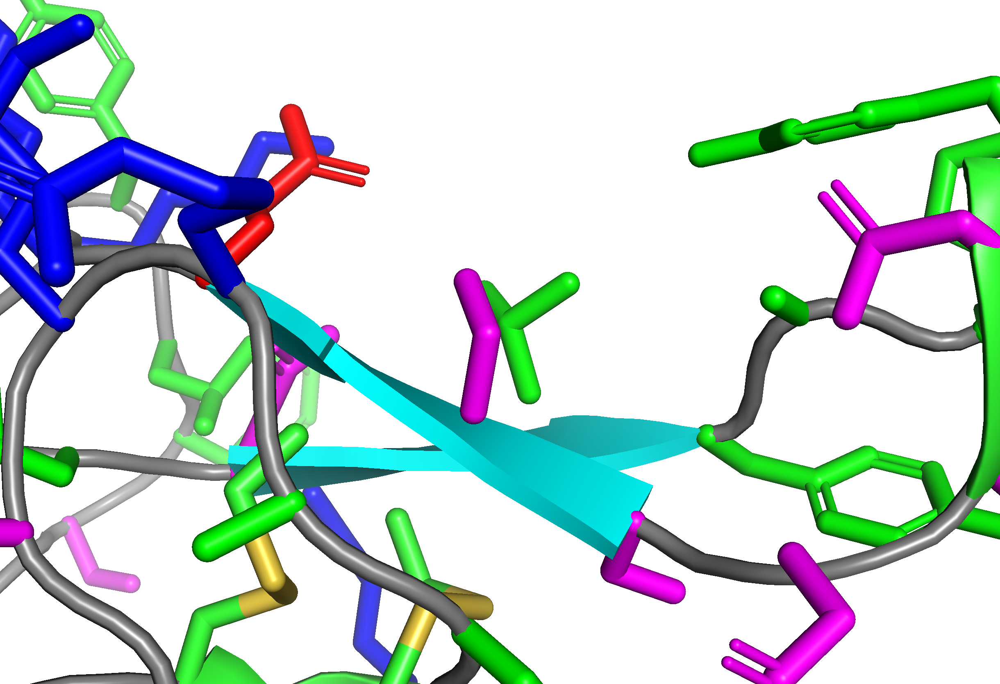

In [224]:
cmd.png('hw4_1.png')
cmd.ray(800,600)
Image(filename='hw4_1.png')

In [320]:
cmd.do('set editing, on')
cmd.do("translate [0, -1, 0], sele resi 30")

In [314]:
cmd.do("translate [0, -1, 0], sele resi 21")

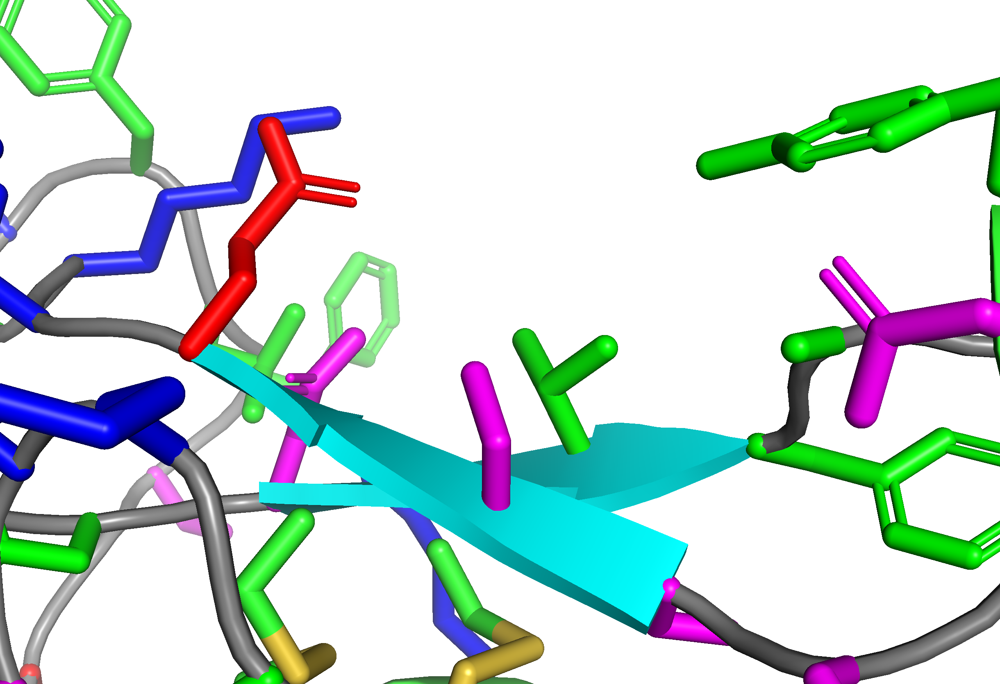

In [322]:
cmd.png('hw4_1.png')
cmd.ray(800,600)
Image(filename='hw4_1.png')

Итоговые картинки:

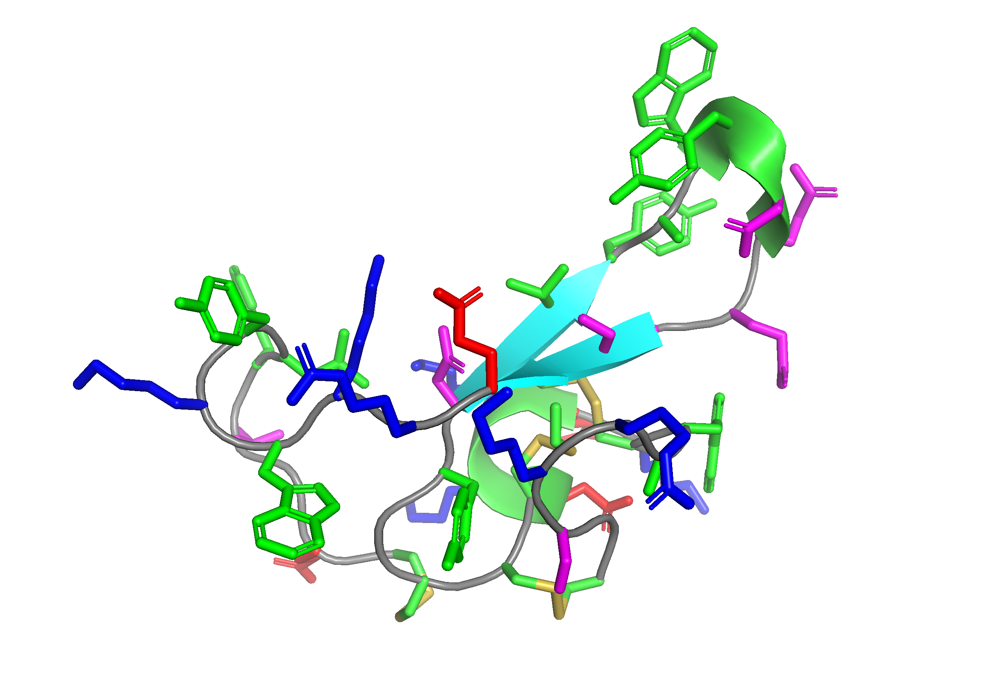

In [332]:
cmd.png('hw4_final.png')
cmd.ray(800,600)
Image(filename='hw4_final.png')

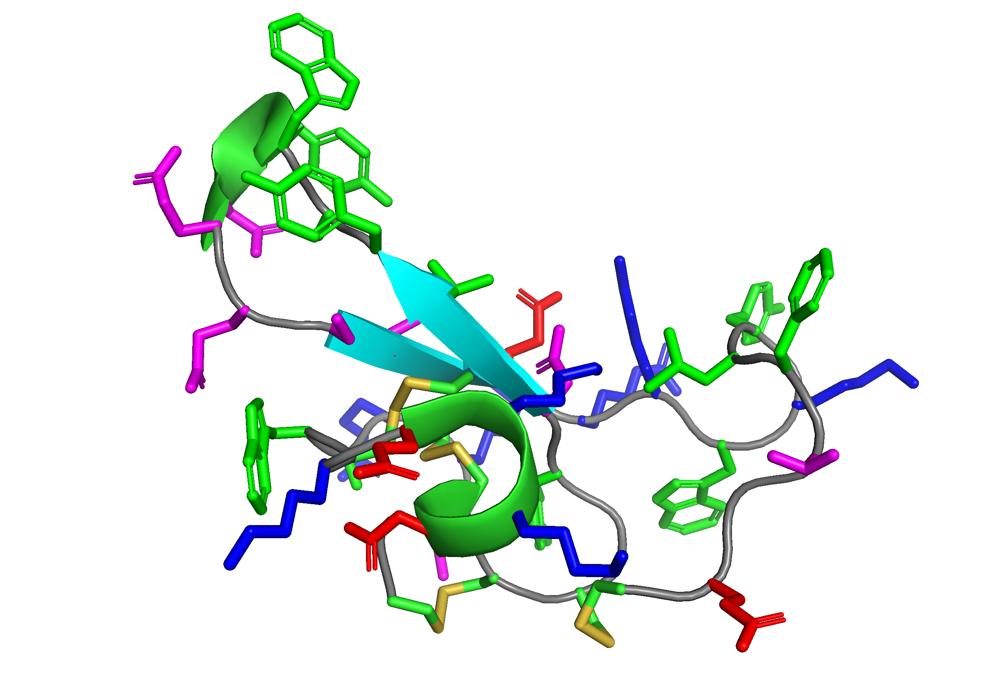

In [334]:
cmd.do('turn y, 180')
cmd.png('hw4_final_180.png')
cmd.ray(800,600)
Image(filename='hw4_final_180.png')

## Задача 1.2

In [365]:
cmd.reinitialize()
cmd.do('bg white')
cmd.fetch ('2ROO')

'2ROO'

In [367]:
cmd.do('set all_states, on')
cmd.do('select bb, bb. and not h.')
cmd.do('intra_fit bb, 1')
cmd.do('split_states 2ROO')

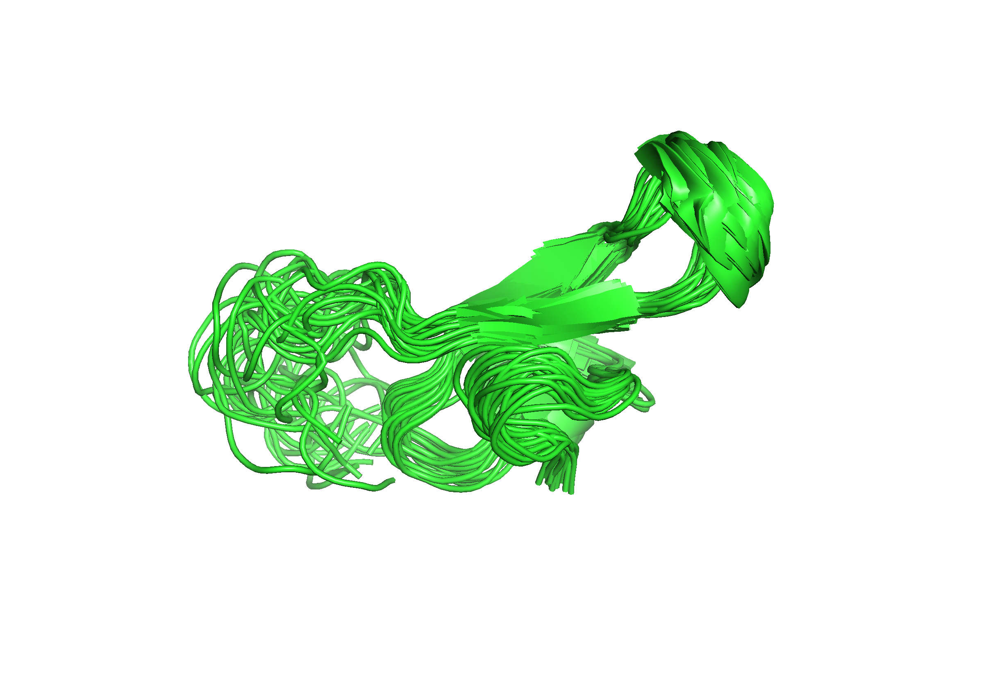

In [352]:
cmd.png('hw4_2.png')
cmd.ray(800,600)
Image(filename='hw4_2.png')

Использую код с семинара:

In [369]:
cmd.do('align_atoms = "(name CA+C+N) or (resn CYS and not (name H* or name O or name N))"')
cmd.do('intra_fit $align_atoms')

In [371]:
cmd.do('hide all; show lines, name CA+C+N; color black, name CA+C+N; bg_color white')

In [373]:
cmd.do('show sticks, resn CYS and not (name H* or name O or name N or name C or name CA)')
cmd.do('color orange, resn CYS and not (name H* or name O or name N or name C or name CA)')

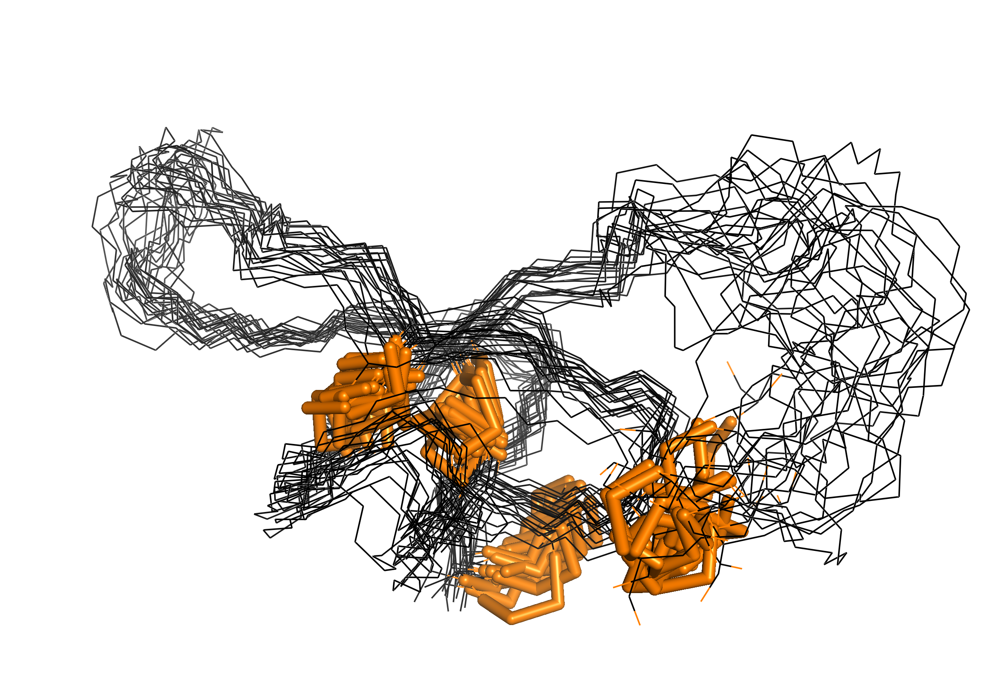

In [377]:
cmd.png('hw4_2_final.png')
cmd.ray(800,600)
Image(filename='hw4_2_final.png')

# Задача 1.3

Произвела расчет электростатического потенциала для своей молекулы 2ROO на http://server.poissonboltzmann.org
- нажимаем PDB2PQR
- вводим PDB ID 2ROO
- остальные параметры оставляем по умолчанию
- Нажимаем Start Job
- После завершения первого расчета нажимаем “Use results with APBS”
- Нажимаем Start Job
- После завершения расчета, скачиваем файл *.dx и переименовываем в 2ROO-pot.dx


In [27]:
cmd.reinitialize()
cmd.do('bg white')
cmd.fetch ('2ROO')
cmd.do("load 2ROO-pot.dx")
cmd.do("ramp_new espramp, 2ROO-pot, [-7, 0, 7]")
cmd.do("show surface")
cmd.do("set surface_color, espramp")
cmd.do("set surface_ramp_above_mode")

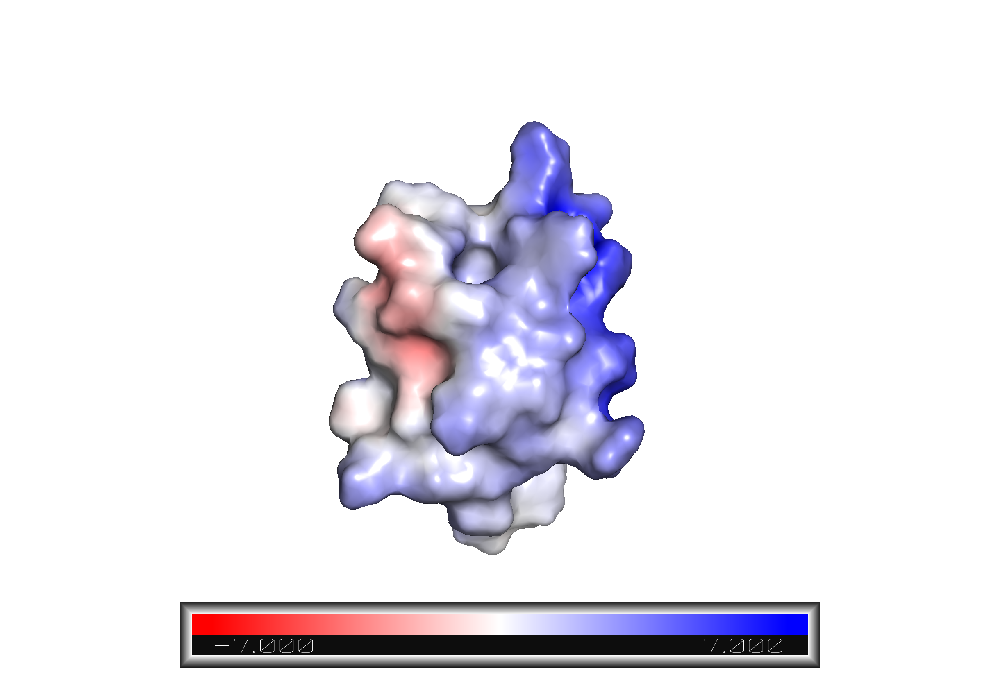

In [7]:
cmd.png('hw4_3_final.png')
cmd.ray(800,600)
Image(filename='hw4_3_final.png')

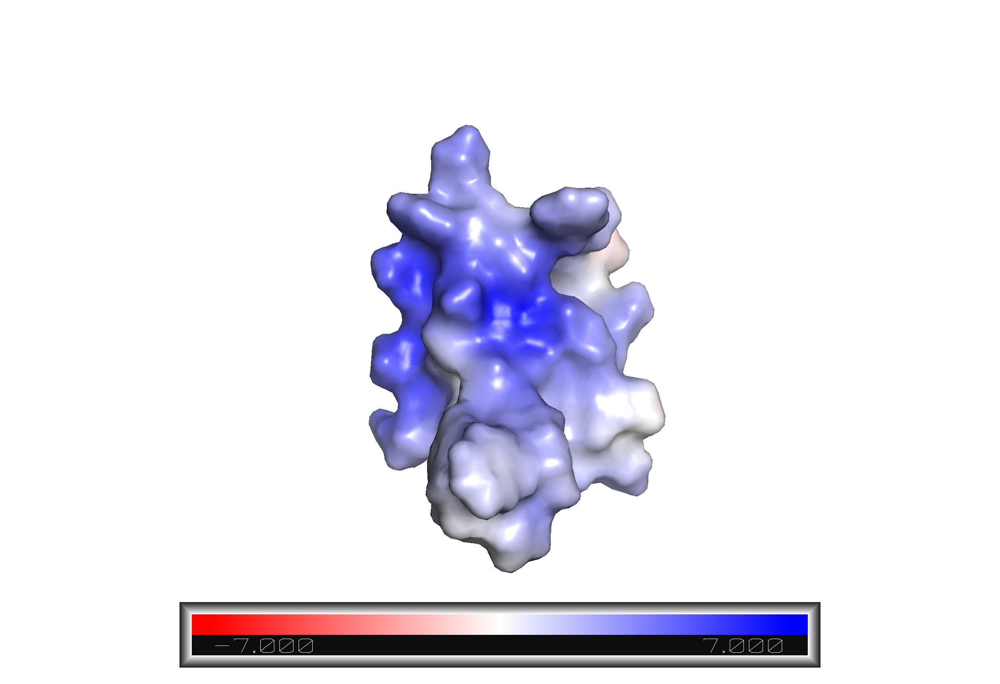

In [9]:
cmd.do('turn y, 180')
cmd.png('hw4_4_final_180.png')
cmd.ray(800,600)
Image(filename='hw4_4_final_180.png')

Видим, что в основном наш белок заряжен положительно, но есть на противоположной стороне и отрицательно заряженная часть

# Задача 1.4

In [57]:
cmd.reinitialize()
cmd.do('bg white')
cmd.fetch ('2ROO')

'2ROO'

In [59]:
cmd.do("run color_h.py")
cmd.do("color_h")
cmd.do("show surface, 2ROO")
cmd.do("set surface_color, default") # потому что иначе серое

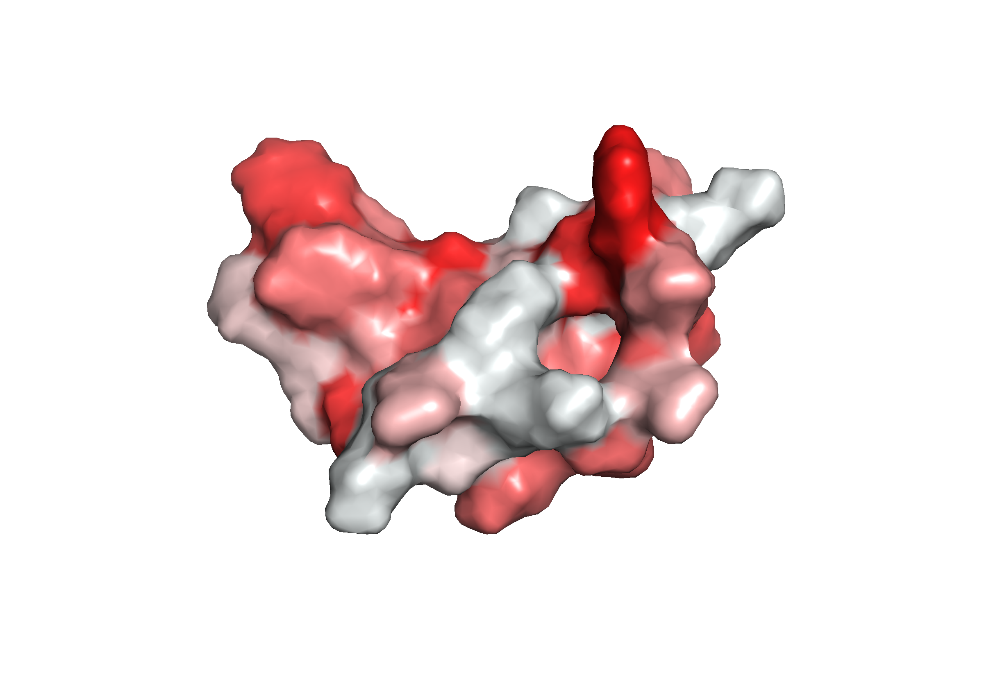

In [61]:
cmd.png('hw4_4_final.png')
cmd.ray(800,600)
Image(filename='hw4_4_final.png')

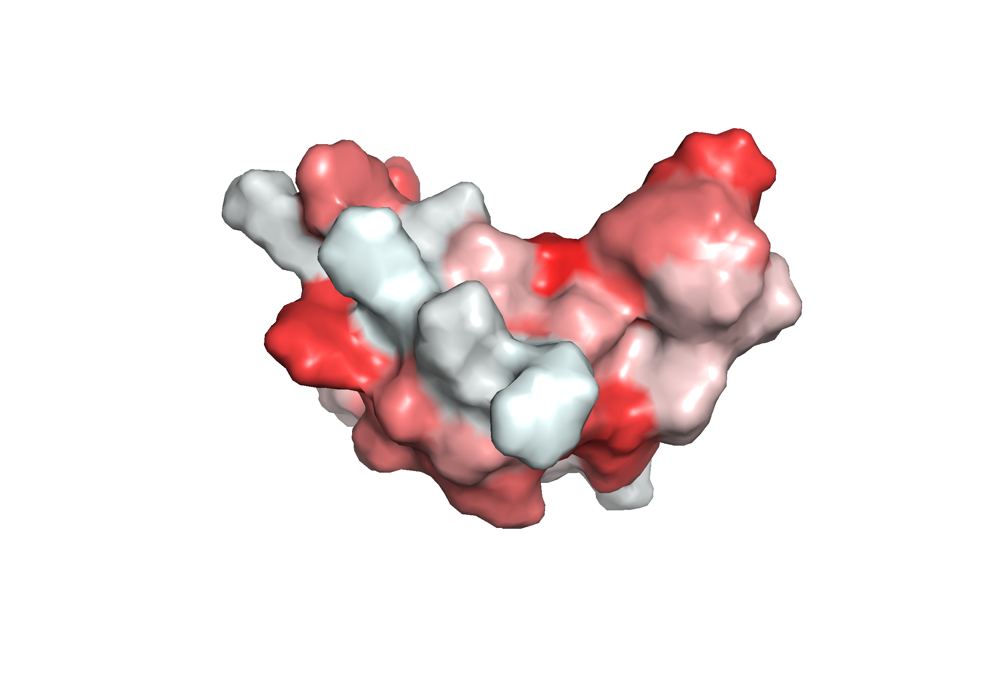

In [63]:
cmd.do('turn y, 180')
cmd.png('hw4_4_final_180.png')
cmd.ray(800,600)
Image(filename='hw4_4_final_180.png')

In [65]:
cmd.do("run color_h.py")
cmd.do("color_h2")
cmd.do("show surface, 2ROO")
cmd.do("set surface_color, default") # потому что иначе серое

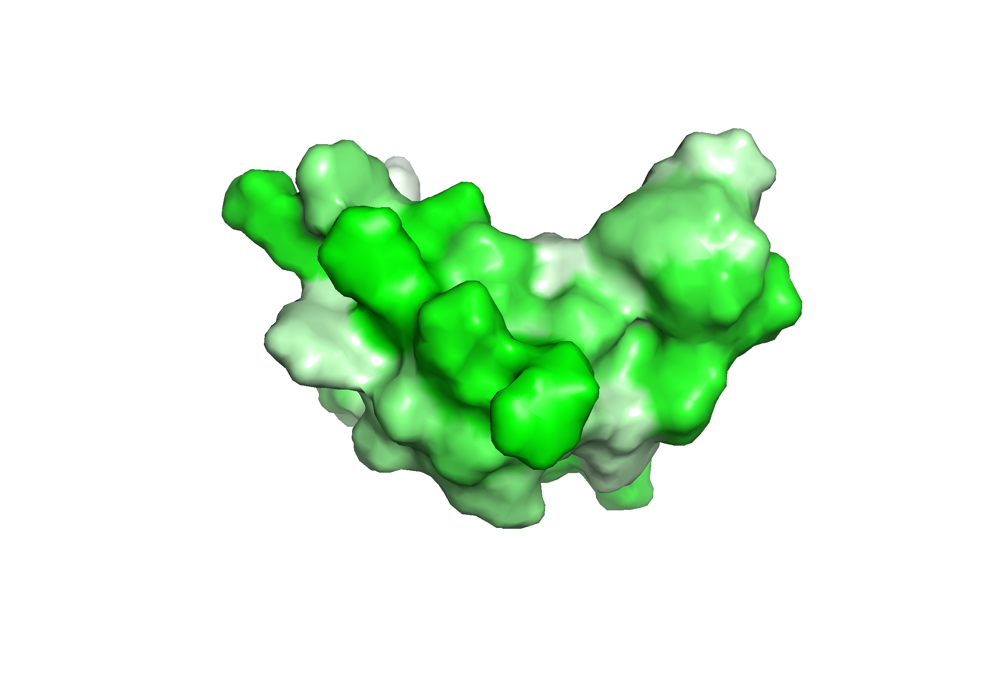

In [67]:
cmd.png('hw4_4_final.png')
cmd.ray(800,600)
Image(filename='hw4_4_final.png')

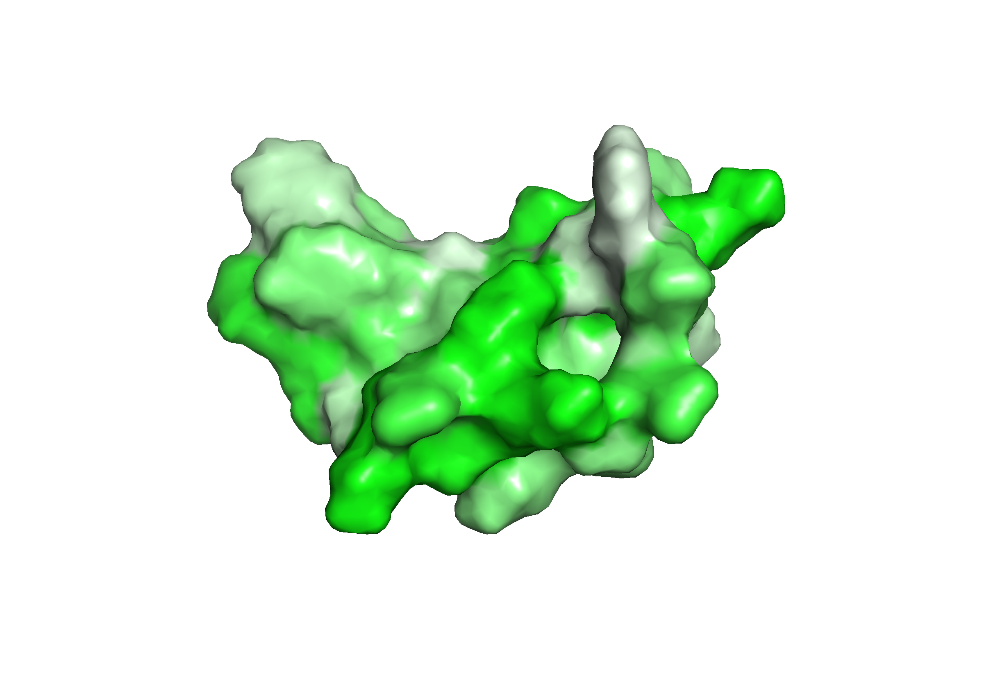

In [69]:
cmd.do('turn y, 180')
cmd.png('hw4_4_final_180.png')
cmd.ray(800,600)
Image(filename='hw4_4_final_180.png')